In [2]:
import pandas as pd
import numpy as np
import os

In [3]:
path =  r"C:\Users\anu10\OneDrive\Instacart Basket Analysis"

path_cf =  r"C:\Users\anu10\OneDrive\Documents\Career foundry Python"

In [4]:
path

'C:\\Users\\anu10\\OneDrive\\Instacart Basket Analysis'

In [5]:
# 1. Importing ords_prod_merged
ords_prods_merge=pd.read_pickle(os.path.join(path_cf, '02 Data','Prepared Data', 'ords_prods_merged.pkl'))

In [6]:
df_dep_csv = pd.read_csv(os.path.join(path_cf, '02 Data\Original Data\departments.csv'),index_col = False)
dep_t = df_dep_csv.head().T[1:] #.rename({'department_id', 'name'})
df_dep = pd.DataFrame({'department_id': dep_t.index, 'name': dep_t[0]})
df_dep['department_id'] = df_dep['department_id'].astype(int)
df_dep.head()

,department_id,name
1,1,frozen
2,2,other
3,3,bakery
4,4,produce
5,5,alcohol


In [7]:
# Create a subset
df = ords_prods_merge[:100000]

In [8]:
df.shape

(100000, 19)

In [9]:
df.head(10)

,Unnamed: 0,product_id,product_name,aisle_id,department_id,prices,order_id,user_id,eval_set,order_number,orders_day_of_week,order_hour_of_day,days_since_prior_order,add_to_cart_order,reordered,_merge,busiest_day,busiest_days,busiest_period_of_day
0,0,1,Chocolate Sandwich Cookies,61,19,5.8,3139998,138,prior,28,6,11,3.0,5,0,both,Regularly busy,Regularly days,Most orders
1,0,1,Chocolate Sandwich Cookies,61,19,5.8,1977647,138,prior,30,6,17,20.0,1,1,both,Regularly busy,Regularly days,Average orders
2,0,1,Chocolate Sandwich Cookies,61,19,5.8,389851,709,prior,2,0,21,6.0,20,0,both,Busiest day,Busiest days,Average orders
3,0,1,Chocolate Sandwich Cookies,61,19,5.8,652770,764,prior,1,3,13,NaN,10,0,both,Regularly busy,Slowest days,Most orders
4,0,1,Chocolate Sandwich Cookies,61,19,5.8,1813452,764,prior,3,4,17,9.0,11,1,both,Least day,Slowest days,Average orders
5,0,1,Chocolate Sandwich Cookies,61,19,5.8,1701441,777,prior,16,1,7,26.0,7,0,both,Regularly busy,Busiest days,Average orders
6,0,1,Chocolate Sandwich Cookies,61,19,5.8,1871483,825,prior,3,2,14,30.0,2,0,both,Regularly busy,Regularly days,Most orders
7,0,1,Chocolate Sandwich Cookies,61,19,5.8,1290456,910,prior,12,3,10,30.0,1,0,both,Regularly busy,Slowest days,Most orders
8,0,1,Chocolate Sandwich Cookies,61,19,5.8,369558,1052,prior,10,1,20,19.0,1,0,both,Regularly busy,Busiest days,Average orders
9,0,1,Chocolate Sandwich Cookies,61,19,5.8,589712,1052,prior,15,1,12,15.0,2,1,both,Regularly busy,Busiest days,Most orders


In [10]:
df.groupby('product_name').size().sort_values(ascending=False).head(10)

product_name
European Cucumber                                          18413
Organic Mini Homestyle Waffles                              4919
Nectarines                                                  4903
Vanilla Milk Chocolate Almond Ice Cream Bars Multi-Pack     3864
Restaurant Style Organic Chia & Quinoa Tortilla Chips       3639
Petit Suisse Fruit                                          3636
Wild Albacore Tuna No Salt Added                            3585
100% Recycled Aluminum Foil                                 3282
Organic Rice Vinegar                                        2787
Sparkling Orange Juice & Prickly Pear Beverage              2572
dtype: int64

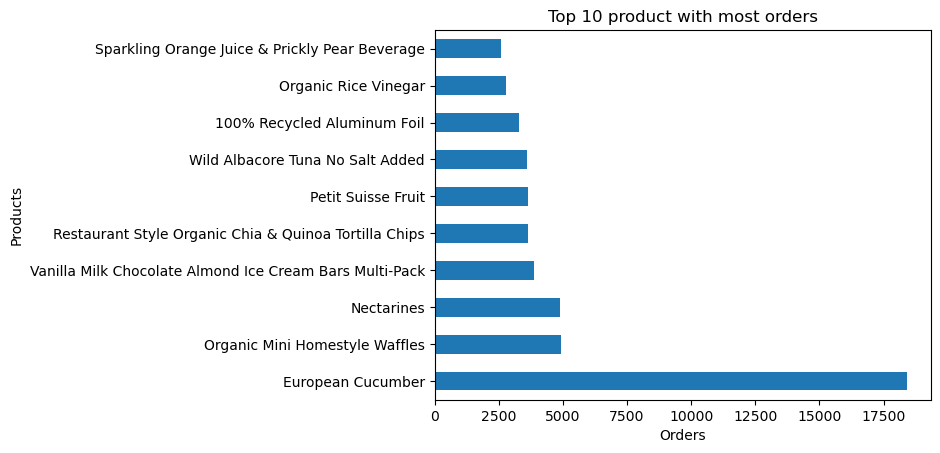

In [11]:
bar_product = df.groupby('product_name').size().sort_values(ascending=False).head(10).plot.barh(xlabel = 'Orders', ylabel = 'Products',title = 'Top 10 product with most orders')

In [12]:
bar_product.figure.savefig(os.path.join(path, '04 Analysis','Visualizations', 'bar_product.png'))

In [13]:
popular_dept = df.groupby(['department_id']).order_number.count().sort_values(ascending=False).head(10)
popular_dept_df = pd.DataFrame({'department_id': popular_dept.index, 'orders': popular_dept.values})
df_popular_dept_merged = df_dep.merge(popular_dept_df, on=['department_id']).sort_values(by='orders', ascending=True)

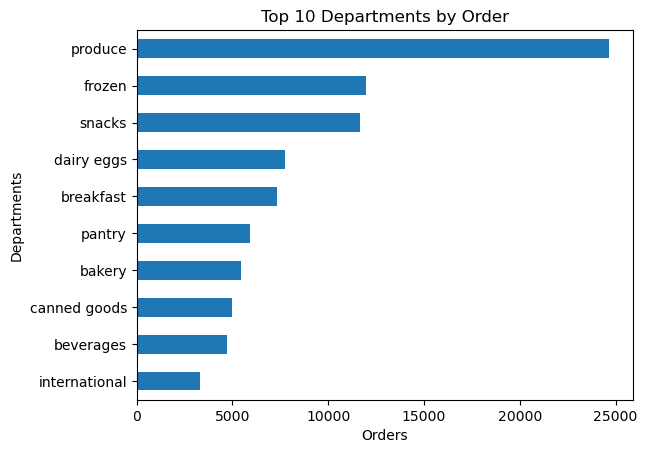

In [14]:
barh_dep_popularity = df_popular_dept_merged.plot.barh(x = 'name',y = 'orders',ylabel='Departments', xlabel='Orders',title = 'Top 10 Departments by Order', legend = False)

In [15]:
barh_dep_popularity.figure.savefig(os.path.join(path, '04 Analysis','Visualizations', 'dep_popularity.png'))

In [16]:
# Aggregating DAta with agg()
# mean list
df.groupby('department_id').agg({'order_number':['mean']})

,order_number
,mean
department_id,
1,17.985613
2,27.246154
3,19.161060
4,15.285054
5,12.893939
6,18.010959
7,16.804394
8,12.749307


In [17]:
df.groupby('department_id')['order_number'].mean()

department_id
1     17.985613
2     27.246154
3     19.161060
4     15.285054
5     12.893939
6     18.010959
7     16.804394
8     12.749307
9     13.413018
11    16.141414
12    14.867995
13    18.284139
14    15.039995
15    16.811887
16    16.586584
17    12.905569
18    21.102372
19    17.973813
20    14.684259
21    25.227273
Name: order_number, dtype: float64

In [18]:
df.groupby('department_id').order_number.mean()

department_id
1     17.985613
2     27.246154
3     19.161060
4     15.285054
5     12.893939
6     18.010959
7     16.804394
8     12.749307
9     13.413018
11    16.141414
12    14.867995
13    18.284139
14    15.039995
15    16.811887
16    16.586584
17    12.905569
18    21.102372
19    17.973813
20    14.684259
21    25.227273
Name: order_number, dtype: float64

In [19]:
# Performing multiple aggregations
df.groupby('department_id').agg({'order_number':['mean','min','max']})

order_number        
                      mean min max
department_id                     
1                17.985613   1  99
2                27.246154   1  96
3                19.161060   1  99
4                15.285054   1  99
5                12.893939   1  97
6                18.010959   1  98
7                16.804394   1  98
8                12.749307   1  95
9                13.413018   1  96
11               16.141414   1  92
12               14.867995   1  95
13               18.284139   1  99
14               15.039995   1  99
15               16.811887   1  99
16               16.586584   1  99
17               12.905569   1  74
18               21.102372   1  99
19               17.973813   1  99
20               14.684259   1  99
21               25.227273   2  86

In [20]:
# Aggregating Data with transform
ords_prods_merge['max_order'] = ords_prods_merge.groupby(['user_id'])['order_number'].transform(np.max)

In [21]:
pd.options.display.max_rows = None

In [ ]:
# Deriving Columns with loc()
# 4,5 creating a column loyalty flag
df.loc[ords_prods_merge['max_order'] > 40,'loyalty_flag'] = 'Loyal customer'

In [23]:
ords_prods_merge.loc[(ords_prods_merge['max_order'] <= 40) & (ords_prods_merge['max_order'] > 10) ,'loyalty_flag'] = 'Regular customer'

In [24]:
ords_prods_merge.loc[ords_prods_merge['max_order'] <= 10,'loyalty_flag'] = 'New customer'

In [25]:
df['loyalty_flag'].value_counts(dropna = False)

NaN               67888
Loyal customer    32112
Name: loyalty_flag, dtype: int64

In [26]:
ords_prods_merge[['user_id', 'loyalty_flag', 'order_number']].head(60)

,user_id,loyalty_flag,order_number
0,138,Regular customer,28
1,138,Regular customer,30
2,709,New customer,2
3,764,New customer,1
4,764,New customer,3
5,777,Regular customer,16
6,825,New customer,3
7,910,Regular customer,12
8,1052,Regular customer,10
9,1052,Regular customer,15


In [27]:
ords_prods_merge.shape

(32434212, 21)

In [28]:
# 6.  Create a spending flag for each user based on the average price across all their orders
df.groupby('order_id').agg({'prices':['mean']})

,prices
,mean
order_id,
14,2.300000
134,13.100000
194,14.300000
210,12.400000
224,10.750000
297,14.300000
306,2.300000
312,12.900000


In [29]:
# 6.  Create a spending flag for each user based on the average price across all their orders
ords_prods_merge['spenders'] = ords_prods_merge.groupby(['user_id'])['order_number'].transform(np.max)

In [30]:
ords_prods_merge.loc[ords_prods_merge['spenders'] < 10 ,'Spending_Flag'] = 'Low spender'

In [31]:
ords_prods_merge.loc[ords_prods_merge['spenders'] >= 10 ,'Spending_Flag'] = 'High spender'

In [32]:
bar_spender = ords_prods_merge['Spending_Flag'].value_counts(dropna = False)

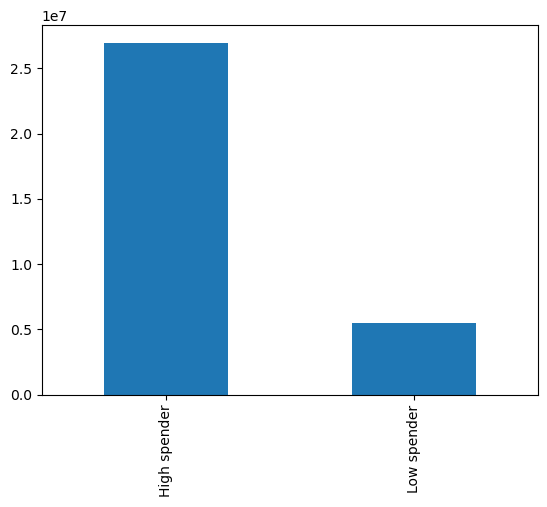

In [33]:
bar_spender = ords_prods_merge['Spending_Flag'].value_counts(dropna = False).plot.bar()

In [34]:
bar_spender.figure.savefig(os.path.join(path, '04 Analysis','Visualizations', 'bar_spender.png'))

In [35]:
ords_prods_merge[['user_id', 'Spending_Flag', 'order_number']].head(10)

,user_id,Spending_Flag,order_number
0,138,High spender,28
1,138,High spender,30
2,709,Low spender,2
3,764,Low spender,1
4,764,Low spender,3
5,777,High spender,16
6,825,Low spender,3
7,910,High spender,12
8,1052,High spender,10
9,1052,High spender,15


In [36]:
ords_prods_merge.shape

(32434212, 23)

In [37]:
# 7. Create an order frequency flag that marks the regularity of a user’s ordering behavior according to the median in the “days_since_prior_order” column
ords_prods_merge["median"] = ords_prods_merge.groupby('user_id').days_since_prior_order.median()


In [38]:
## df.groupby(['user_id'])['order_number'].transform(np.max)

In [39]:
#ords_prods_merge["prices"].value_counts(dropna = False)
ords_prods_merge.head(10)
#ords_prods_merge.shape


,Unnamed: 0,product_id,product_name,aisle_id,department_id,prices,order_id,user_id,eval_set,order_number,...,reordered,_merge,busiest_day,busiest_days,busiest_period_of_day,max_order,loyalty_flag,spenders,Spending_Flag,median
0,0,1,Chocolate Sandwich Cookies,61,19,5.8,3139998,138,prior,28,...,0,both,Regularly busy,Regularly days,Most orders,32,Regular customer,32,High spender,NaN
1,0,1,Chocolate Sandwich Cookies,61,19,5.8,1977647,138,prior,30,...,1,both,Regularly busy,Regularly days,Average orders,32,Regular customer,32,High spender,20.5
2,0,1,Chocolate Sandwich Cookies,61,19,5.8,389851,709,prior,2,...,0,both,Busiest day,Busiest days,Average orders,5,New customer,5,Low spender,13.0
3,0,1,Chocolate Sandwich Cookies,61,19,5.8,652770,764,prior,1,...,0,both,Regularly busy,Slowest days,Most orders,3,New customer,3,Low spender,10.0
4,0,1,Chocolate Sandwich Cookies,61,19,5.8,1813452,764,prior,3,...,1,both,Least day,Slowest days,Average orders,3,New customer,3,Low spender,20.0
5,0,1,Chocolate Sandwich Cookies,61,19,5.8,1701441,777,prior,16,...,0,both,Regularly busy,Busiest days,Average orders,26,Regular customer,26,High spender,11.0
6,0,1,Chocolate Sandwich Cookies,61,19,5.8,1871483,825,prior,3,...,0,both,Regularly busy,Regularly days,Most orders,9,New customer,9,Low spender,6.0
7,0,1,Chocolate Sandwich Cookies,61,19,5.8,1290456,910,prior,12,...,0,both,Regularly busy,Slowest days,Most orders,12,Regular customer,12,High spender,9.0
8,0,1,Chocolate Sandwich Cookies,61,19,5.8,369558,1052,prior,10,...,0,both,Regularly busy,Busiest days,Average orders,20,Regular customer,20,High spender,30.0
9,0,1,Chocolate Sandwich Cookies,61,19,5.8,589712,1052,prior,15,...,1,both,Regularly busy,Busiest days,Most orders,20,Regular customer,20,High spender,30.0


In [40]:
ords_prods_merge.loc[ords_prods_merge['median'] > 20 ,'Frequency_Flag'] = 'Non-frequent customer'

In [41]:
ords_prods_merge.loc[(ords_prods_merge['median'] > 10) & (ords_prods_merge['median'] <=20) ,'Frequency_Flag'] = 'Regular customer'

In [42]:
ords_prods_merge.loc


In [43]:
ords_prods_merge['Frequency_Flag'].value_counts(dropna = False)

NaN                      32314590
Regular customer            60004
Non-frequent customer       59618
Name: Frequency_Flag, dtype: int64

In [44]:
ords_prods_merge[['user_id', 'Frequency_Flag', 'order_number']].head(10)

,user_id,Frequency_Flag,order_number
0,138,NaN,28
1,138,Non-frequent customer,30
2,709,Regular customer,2
3,764,NaN,1
4,764,Regular customer,3
5,777,Regular customer,16
6,825,NaN,3
7,910,NaN,12
8,1052,Non-frequent customer,10
9,1052,Non-frequent customer,15


In [45]:
ords_prods_merge.to_pickle(os.path.join(path_cf, '02 Data','Prepared Data', 'ords_prods_merge.pkl'))

In [46]:
ords_prods_merge.columns

Index(['Unnamed: 0', 'product_id', 'product_name', 'aisle_id', 'department_id',
       'prices', 'order_id', 'user_id', 'eval_set', 'order_number',
       'orders_day_of_week', 'order_hour_of_day', 'days_since_prior_order',
       'add_to_cart_order', 'reordered', '_merge', 'busiest_day',
       'busiest_days', 'busiest_period_of_day', 'max_order', 'loyalty_flag',
       'spenders', 'Spending_Flag', 'median', 'Frequency_Flag'],
      dtype='object')

In [47]:
ords_prods_merge['Spending_Flag'].head()

0    High spender
1    High spender
2     Low spender
3     Low spender
4     Low spender
Name: Spending_Flag, dtype: object

In [ ]:
ords_prods_merge